<a href="https://colab.research.google.com/github/NyelNyet/APIQ/blob/main/DiscretePy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [202]:
import pandas as pd
cols = ["Time Spend on Games Daily","Gaming Cruciality","Number of Platforms Used","Money Spent on Games Weekly","Daily Gaming Affects Academic Performance"]
dh = pd.read_csv('DSSURVEY.csv',skiprows=2, usecols=[4,5,6,7,8] , names = cols)

# Taking middle value for range answer
hoursSpent_map={
    'Less than 1 hour': '0.5',
    '2-3 hours': '2.5',
    '3-4 hours': '3.5',
    '4-5 hours': '4.5',
    'More than 5 hours': '5.5' #Assuming 5.5 for more than 5 hours
}

moneySpent_map={
    'RM0': '0',
    'RM1-10': '5.5',
    'RM11-20': '15.5',
    'RM21-30': '25.5',
    'More than RM30': '35.5' #Assuming 35.5 for more than RM30
}

dh.replace(hoursSpent_map, inplace=True)
dh.replace(moneySpent_map, inplace=True)

dh.head()
# print(dh.to_string())

,Time Spend on Games Daily,Gaming Cruciality,Number of Platforms Used,Money Spent on Games Weekly,Daily Gaming Affects Academic Performance
0,0.5,1,1,0,1
1,5.5,5,1,0,1
2,2.5,3,3,5.5,5
3,0.5,1,1,0,1
4,0.5,1,1,0,1


In [203]:
class Respondent:
  def __init__(self, id, time_spend_on_games_daily, gaming_cruciality, number_of_platforms_used, money_spent_on_games_weekly, daily_gaming_affects_academic_performance):
    self.id = id
    self.time_spend_on_games_daily = time_spend_on_games_daily
    self.gaming_cruciality = gaming_cruciality
    self.number_of_platforms_used = number_of_platforms_used
    self.money_spent_on_games_weekly = money_spent_on_games_weekly
    self.daily_gaming_affects_academic_performance = daily_gaming_affects_academic_performance

  @property
  def id(self):
        return self._id

  @property
  def time_spend_on_games_daily(self):
        return self._time_spend_on_games_daily

  @property
  def gaming_cruciality(self):
        return self._gaming_cruciality

  @property
  def number_of_platforms_used(self):
        return self._number_of_platforms_used

  @property
  def money_spent_on_games_weekly(self):
        return self._money_spent_on_games_weekly

  @property
  def daily_gaming_affects_academic_performance(self):
        return self._daily_gaming_affects_academic_performance

  @id.setter
  def id(self, id):
        self._id = 'R'+id

  @time_spend_on_games_daily.setter
  def time_spend_on_games_daily(self, time_spend_on_games_daily):
        self._time_spend_on_games_daily = time_spend_on_games_daily

  @gaming_cruciality.setter
  def gaming_cruciality(self, gaming_cruciality):
        self._gaming_cruciality = gaming_cruciality

  @number_of_platforms_used.setter
  def number_of_platforms_used(self, number_of_platforms_used):
        self._number_of_platforms_used = number_of_platforms_used

  @money_spent_on_games_weekly.setter
  def money_spent_on_games_weekly(self, money_spent_on_games_weekly):
        self._money_spent_on_games_weekly = money_spent_on_games_weekly

  @daily_gaming_affects_academic_performance.setter
  def daily_gaming_affects_academic_performance(self, daily_gaming_affects_academic_performance):
        self._daily_gaming_affects_academic_performance = daily_gaming_affects_academic_performance

  def printDetail(self):
      print(f"Respondent ID: {self.id}")
      print(f"Time Spend on Games Daily: {self.time_spend_on_games_daily}")
      print(f"Gaming Cruciality: {self.gaming_cruciality}")
      print(f"Number of Platforms Used: {self.number_of_platforms_used}")
      print(f"Money Spent on Games Weekly: {self.money_spent_on_games_weekly}")
      print(f"Daily Gaming Affects Academic Performance: {self.daily_gaming_affects_academic_performance}")
      print("\n")


In [204]:
from ast import Str

respondent_List = []

for index, row in dh.iterrows():
  respondent_List.append(Respondent(str(index+1),
                         row['Time Spend on Games Daily'],
                         row['Gaming Cruciality'],
                         row['Number of Platforms Used'],
                         row['Money Spent on Games Weekly'],
                         row['Daily Gaming Affects Academic Performance']))

Respondent.printDetail(respondent_List[0])

print((len(respondent_List))) # number of data checking

Respondent ID: R1
Time Spend on Games Daily: 0.5
Gaming Cruciality: 1
Number of Platforms Used: 1
Money Spent on Games Weekly: 0
Daily Gaming Affects Academic Performance: 1


21


Total Nodes: 21
Total Edges: 210


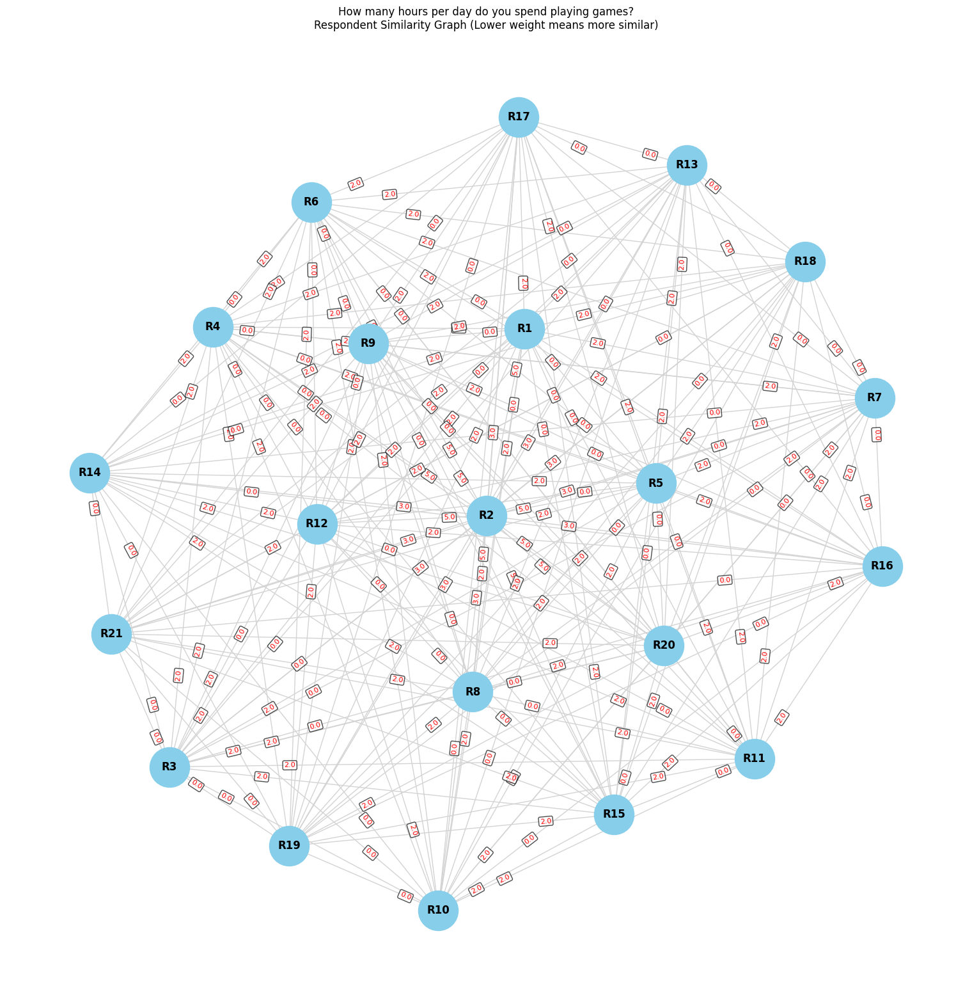

In [217]:
import networkx as nx
import matplotlib.pyplot as plt

def compare(num1, num2):
  return abs(float(num1)-float(num2))

G = nx.Graph()

for resp in respondent_List:
  G.add_node(
      resp.id, # node identifier
      time_spent=resp.time_spend_on_games_daily,
      cruciality=resp.gaming_cruciality,
      platform=resp.number_of_platforms_used,
      money_spent=resp.money_spent_on_games_weekly,
      performance_effect=resp.daily_gaming_affects_academic_performance
      )

if not respondent_List:
  print("Respondent List is empty")
else:
  edges_to_add = []
  for currResp in respondent_List:
    curr_Resp = currResp
    for nextResp in respondent_List:
      next_Resp = nextResp
      if curr_Resp.id != next_Resp.id:
        weight = compare(curr_Resp.time_spend_on_games_daily, next_Resp.time_spend_on_games_daily)
        # print(f'Comparing {curr_Resp.id} with {next_Resp.id} ; Weight: {weight}')
        edges_tuple = (curr_Resp.id, next_Resp.id, weight) # The format is (node1, node2, weight)
        edges_to_add.append(edges_tuple)
        G.add_weighted_edges_from(edges_to_add)

print(f'Total Nodes: {G.number_of_nodes()}')
print(f'Total Edges: {G.number_of_edges()}')

plt.figure(figsize=(15,15))

pos = nx.spring_layout(G, k=0.8, seed=42) # 'k' adjusts the spacing between nodes

nx.draw(
    G,
    pos,
    with_labels=True,
    node_color='skyblue',
    node_size=2000,
    edge_color='lightgray',
    font_size=12,
    font_weight='bold'
)

# 4. Get the edge weights to display them as labels
edge_labels = nx.get_edge_attributes(G, 'weight')

# Format the labels to show only one decimal place
for key, value in edge_labels.items():
    edge_labels[key] = f'{value:.1f}'

# 5. Draw the edge labels on top of the edges
nx.draw_networkx_edge_labels(
    G,
    pos,
    edge_labels=edge_labels,
    font_color='red',
    label_pos=0.2,
    font_size=8,
    # The bbox dictionary defines the background box
    bbox=dict(facecolor='white',  # The background color of the box
              edgecolor='black',  # The border color of the box (or 'none')
              alpha=0.7,       # The transparency of the box
              boxstyle='round,pad=0.2') # The shape of the box
)

plt.title("How many hours per day do you spend playing games?\nRespondent Similarity Graph (Lower weight means more similar)")
plt.show()


---Build graph for Time Spend on Games Daily---
Total Nodes: 21
Total Edges: 210
Total weight of all edges: 280.00


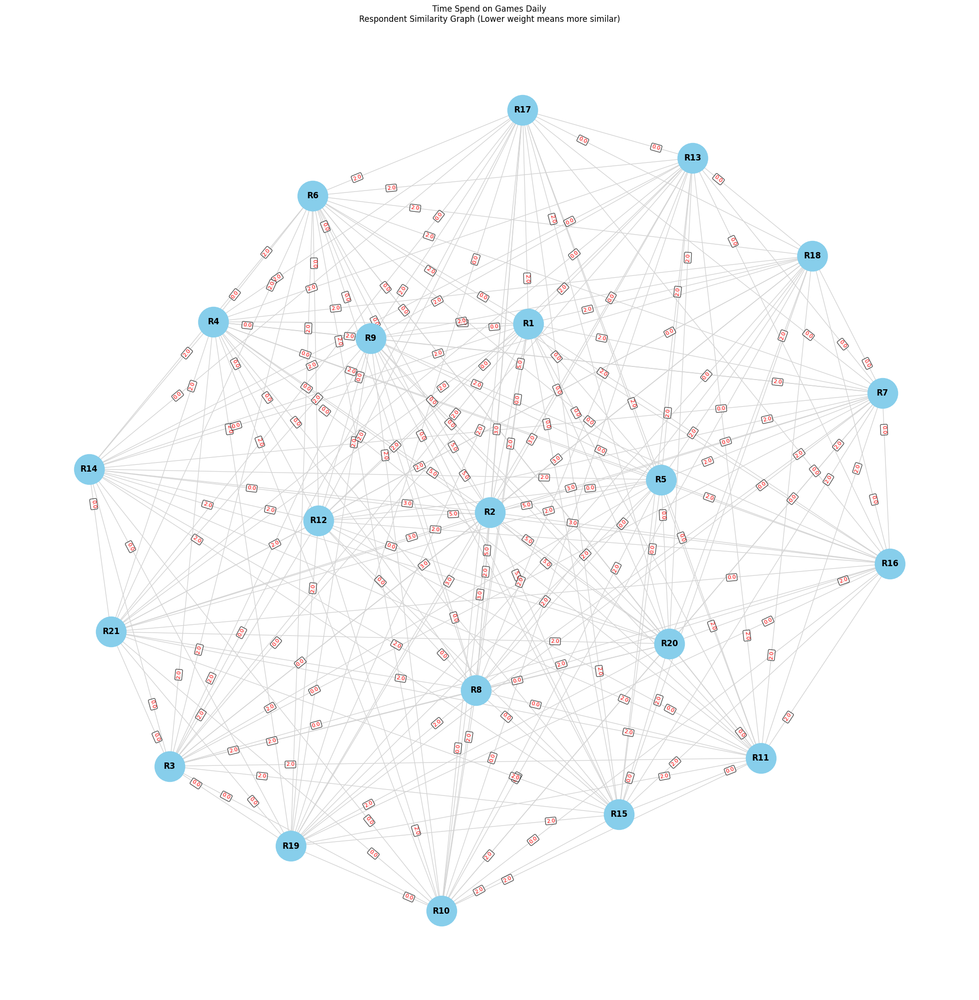


---Build graph for Gaming Cruciality---
Total Nodes: 21
Total Edges: 210
Total weight of all edges: 308.00


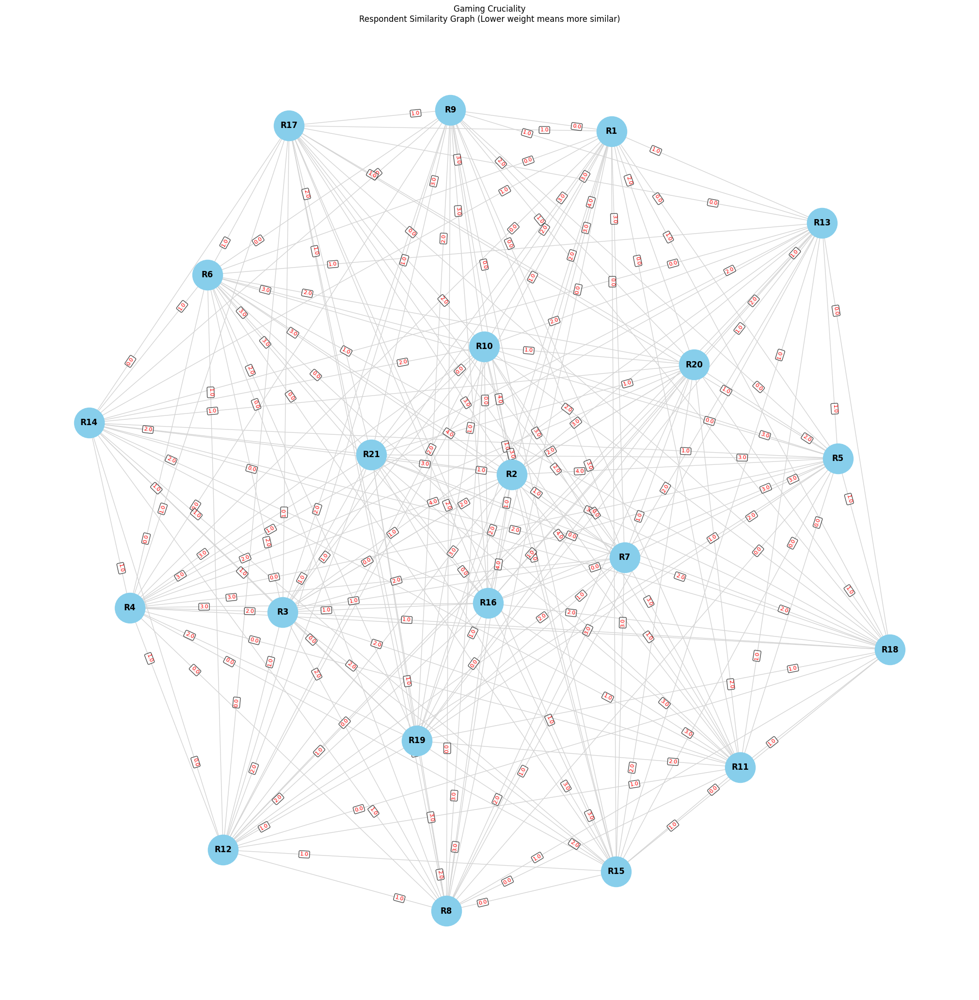


---Build graph for Number of Platforms Used---
Total Nodes: 21
Total Edges: 210
Total weight of all edges: 148.00


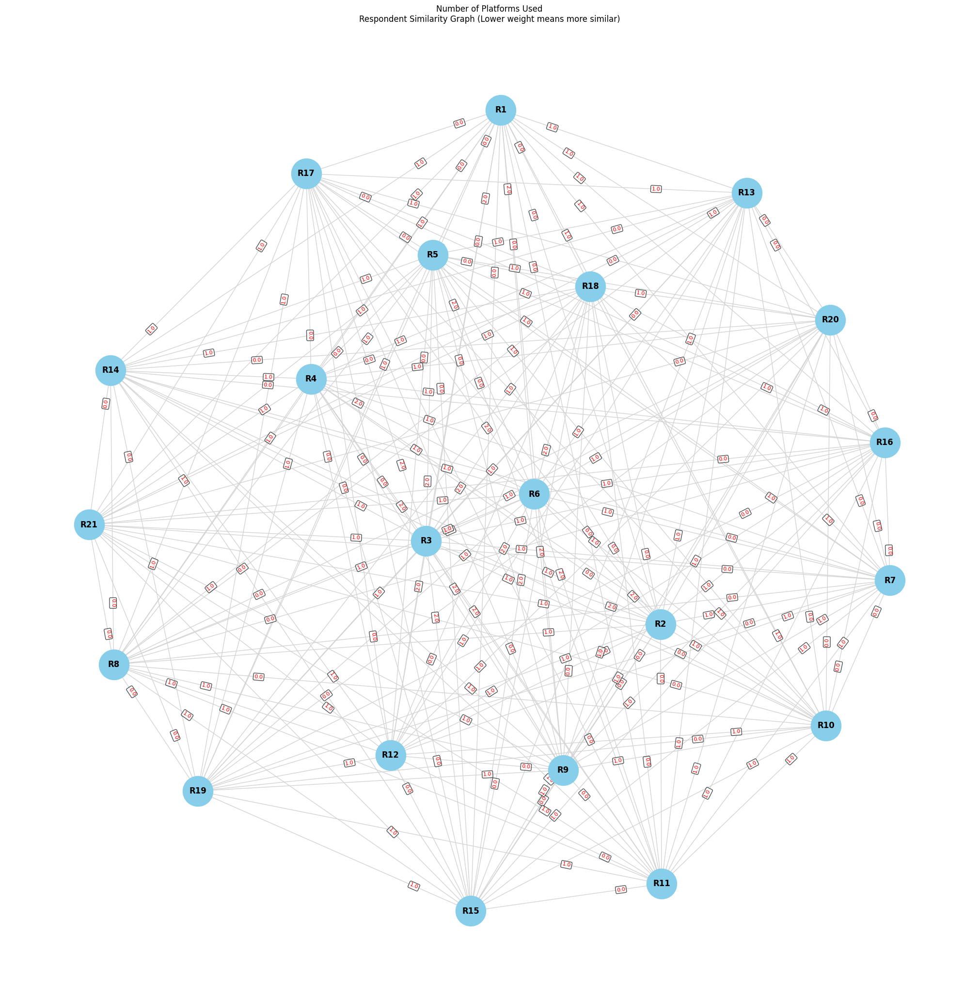


---Build graph for Money Spent on Games Weekly---
Total Nodes: 21
Total Edges: 210
Total weight of all edges: 440.00


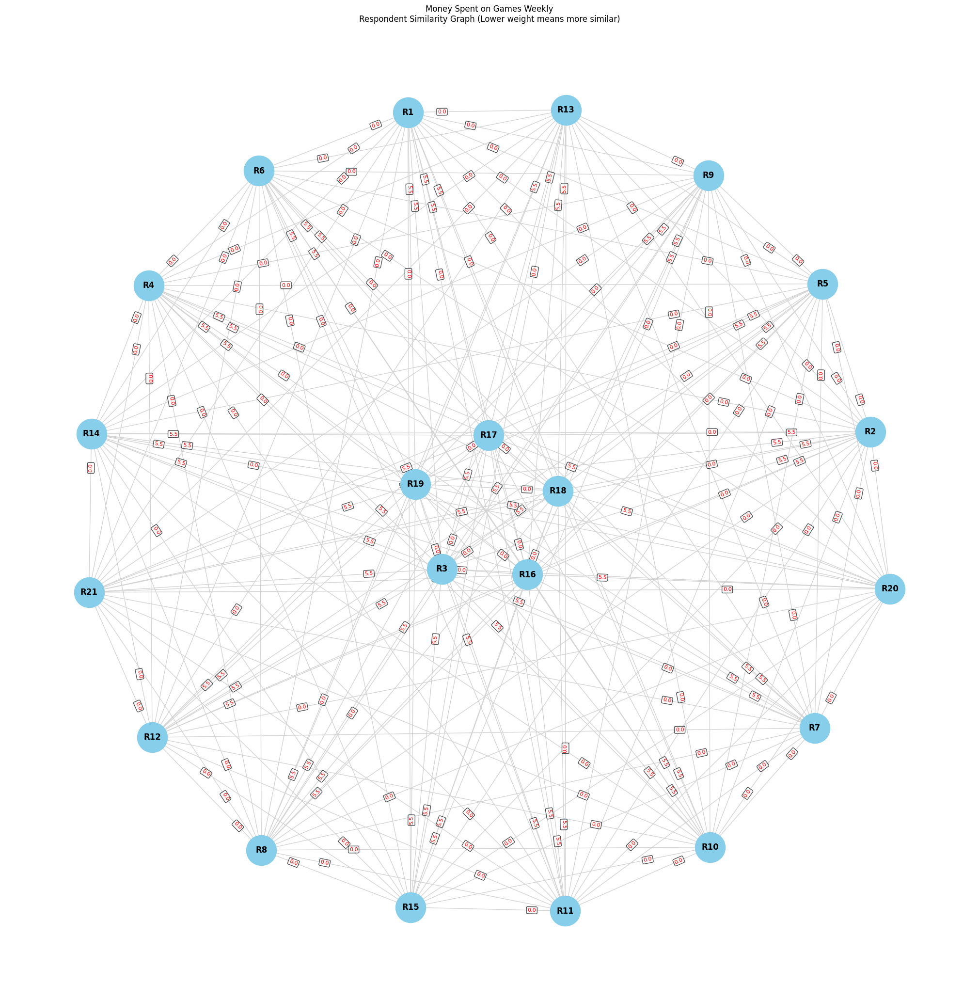


---Build graph for Daily Gaming Affects Academic Performance---
Total Nodes: 21
Total Edges: 210
Total weight of all edges: 326.00


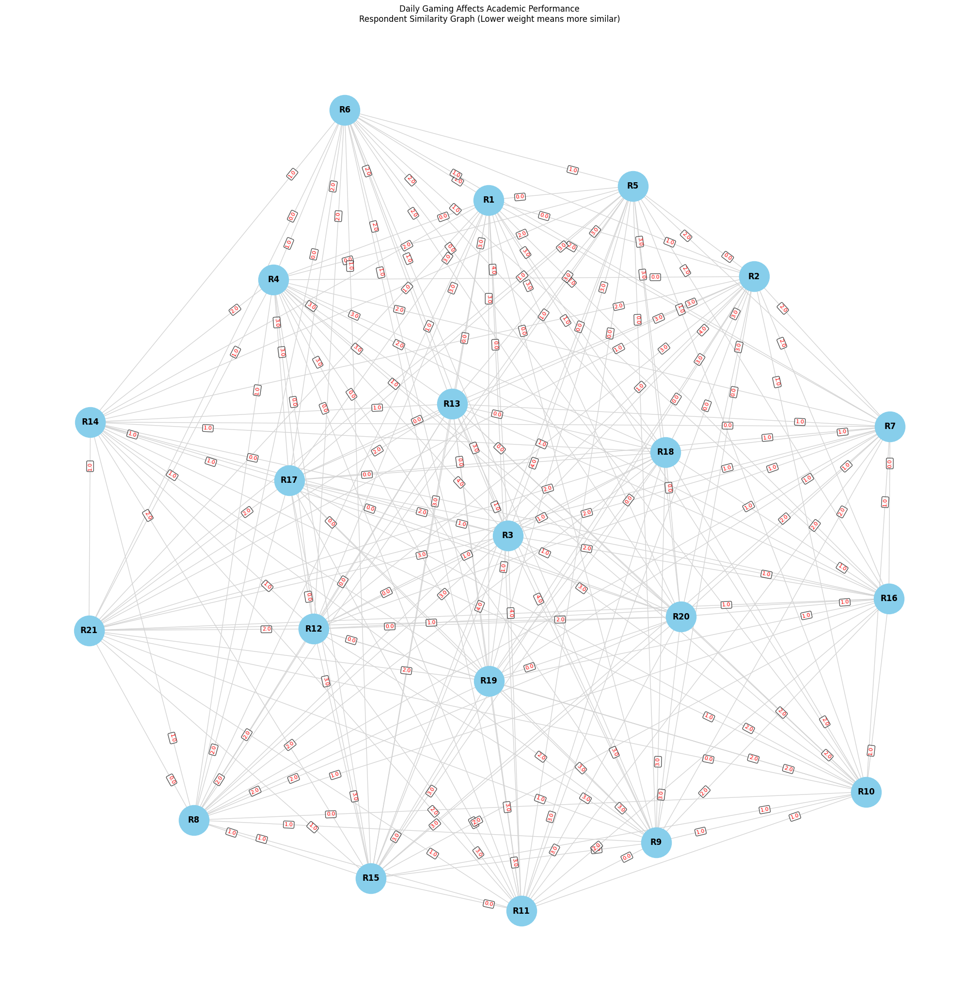

In [230]:
import networkx as nx
import matplotlib.pyplot as plt

def compare(num1, num2):
  return abs(float(num1)-float(num2))

q_Cols =(
    "Time Spend on Games Daily",
    "Gaming Cruciality",
    "Number of Platforms Used",
    "Money Spent on Games Weekly",
    "Daily Gaming Affects Academic Performance"
)

graphs = {question: nx.Graph() for question in q_Cols}

for q_Name in graphs.keys(): # Iterate over the keys of the dictionary
  G = nx.Graph() # Create a new graph for each question
  print(f'\n---Build graph for {q_Name}---')

  for resp in respondent_List:
    G.add_node(resp.id) # adding nodes per respondent


  edges_to_add = []
  for curr_resp in respondent_List:
    for next_resp in respondent_List:
      if curr_resp.id != next_resp.id:
        # Use getattr() to get the attribute based on the question_name string
        value1 = getattr(curr_resp, q_Name.lower().replace(' ', '_')) # Assumes attribute names match column names
        value2 = getattr(next_resp, q_Name.lower().replace(' ', '_'))

        weight = compare(value1,value2)

        edges_to_add.append((curr_resp.id, next_resp.id, weight))
        G.add_weighted_edges_from(edges_to_add)

  total_weight = G.size(weight='weight')
  print(f'Total Nodes: {G.number_of_nodes()}')
  print(f'Total Edges: {G.number_of_edges()}')

  print(f'Total weight of all edges: {total_weight:.2f}')

  plt.figure(figsize=(20,20))

  pos = nx.spring_layout(G, k=0.8, seed=42) # 'k' adjusts the spacing between nodes

  nx.draw(
      G,
      pos,
      with_labels=True,
      node_color='skyblue',
      node_size=2000,
      edge_color='lightgray',
      font_size=12,
      font_weight='bold'
  )

  # 4. Get the edge weights to display them as labels
  edge_labels = nx.get_edge_attributes(G, 'weight')

  # Format the labels to show only one decimal place
  for key, value in edge_labels.items():
      edge_labels[key] = f'{value:.1f}'

  # 5. Draw the edge labels on top of the edges
  nx.draw_networkx_edge_labels(
      G,
      pos,
      edge_labels=edge_labels,
      font_color='red',
      label_pos=0.2,
      font_size=8,
      # The bbox dictionary defines the background box
      bbox=dict(facecolor='white',  # The background color of the box
                edgecolor='black',  # The border color of the box (or 'none')
                alpha=0.7,       # The transparency of the box
                boxstyle='round,pad=0.2') # The shape of the box
  )

  plt.title(f"{q_Name}\nRespondent Similarity Graph (Lower weight means more similar)")
  plt.show()